In [10]:
import gc
from tokenizers import Tokenizer
import torch

In [11]:
from rich import print as rprint
from rich.traceback import install
install()

<bound method InteractiveShell.excepthook of <ipykernel.zmqshell.ZMQInteractiveShell object at 0x7ff3ca7ab640>>

In [2]:
import train
import importlib
train = importlib.reload(train)

In [38]:
test_text = """
 <unk> played basketball and baseball during high school as well . He <unk> in basketball with the Knights . At the 2001 Big League World Series , <unk> played for Team Canada as a shortstop and center <unk> , helping the team to third place in the international competition . Despite being skilled as a baseball player , <unk> chose football over professional baseball due to the <unk> of the former sport . 

"""

In [42]:
tokenizer = Tokenizer.from_file('./tokenizer/tokenizer.json')

In [43]:
token_ids = tokenizer.encode(test_text).ids
tokens = tokenizer.encode(test_text).tokens

In [44]:
len(token_ids)

82

In [107]:
checkpoint = './lightning_logs/version_10/checkpoints/epoch=3539-step=399999.ckpt'
model = train.Net.load_from_checkpoint(checkpoint, hparams_file='./lightning_logs/version_10/hparams.yaml')

In [108]:
memory_length = model.hparams.memory_length_val
bptt = model.hparams.bptt_val
memory_length = 40
bptt = 42
input_1 = torch.tensor(token_ids[:memory_length]).unsqueeze(dim=1)  # seq_length first
input_2 = torch.tensor(token_ids[memory_length: memory_length + bptt]).unsqueeze(dim=1)

In [109]:
model.eval()
with torch.no_grad():
    model(input_1)  # fill the memory
    rprint(len(model.model.memory))
    rprint(model.model.memory[1].shape)
    _, atts = model(input_2, return_att=True)

7

torch.Size([40, 1, 32])

In [110]:
for att in atts:
    for i in range(bptt):
        att[i] *= ((i + memory_length + 1) / (memory_length + bptt))

In [111]:
for att in atts:
    for i in range(model.hparams.num_heads):
        att[..., i] = torch.where(att[..., i] < att[..., i].quantile(0.9), torch.tensor(0).float(), att[..., i])

In [112]:
atts[0].shape

torch.Size([42, 82, 1, 3])

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns

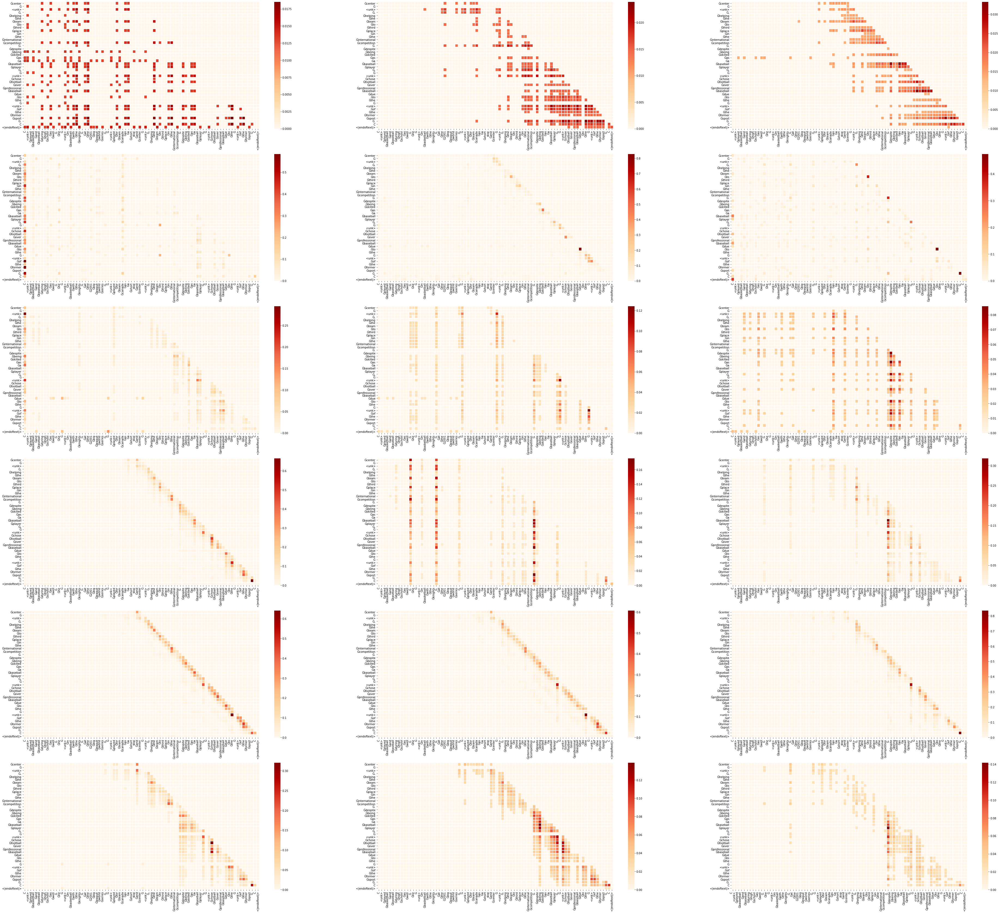

In [114]:
f, axs = plt.subplots(6, 3, figsize=(22 * 3, 10 * 6))
for i in range(model.hparams.num_layers):
    for j in range(model.hparams.num_heads):
        fig = sns.heatmap(atts[i][..., 0, j], ax=axs[i, j], cmap="OrRd", linewidths=.5)
        fig.set_xticklabels(tokens)
        fig.set_yticklabels(tokens[40:])
        plt.xticks(
            rotation=90,
            horizontalalignment='right',
        )
        plt.yticks(
            rotation=0,
            horizontalalignment='right',
        )
plt.savefig('./att_all.jpg')
None